In [16]:
from selective_bayes import *
import numpy as np
import math
import pandas as pd
from sklearn.metrics import normalized_mutual_info_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

## Preprocessing of Invistico Airline dataset
The dataset consists of the details of customers who have already flown with them. The feedback of the customers on various context and their flight data has been consolidated.
The main purpose of this dataset is to predict whether a future customer would be satisfied with their service given the details of the other parameters values.
Dataset is rather balanced (45% dissatisfied vs 55% satisfied) and consists of 23 predictor columns.

In [2]:
dataset = pd.read_csv('Invistico_Airline.csv')
dataset.head()

,satisfaction,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,...,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes,Arrival Delay in Minutes
0,satisfied,Female,Loyal Customer,65,Personal Travel,Eco,265,0,0,0,...,2,3,3,0,3,5,3,2,0,0.0
1,satisfied,Male,Loyal Customer,47,Personal Travel,Business,2464,0,0,0,...,2,3,4,4,4,2,3,2,310,305.0
2,satisfied,Female,Loyal Customer,15,Personal Travel,Eco,2138,0,0,0,...,2,2,3,3,4,4,4,2,0,0.0
3,satisfied,Female,Loyal Customer,60,Personal Travel,Eco,623,0,0,0,...,3,1,1,0,1,4,1,3,0,0.0
4,satisfied,Female,Loyal Customer,70,Personal Travel,Eco,354,0,0,0,...,4,2,2,0,2,4,2,5,0,0.0


In [3]:
len(dataset.columns)

23

In [4]:
dataset.nunique()

satisfaction                            2
Gender                                  2
Customer Type                           2
Age                                    75
Type of Travel                          2
Class                                   3
Flight Distance                      5398
Seat comfort                            6
Departure/Arrival time convenient       6
Food and drink                          6
Gate location                           6
Inflight wifi service                   6
Inflight entertainment                  6
Online support                          6
Ease of Online booking                  6
On-board service                        6
Leg room service                        6
Baggage handling                        5
Checkin service                         6
Cleanliness                             6
Online boarding                         6
Departure Delay in Minutes            466
Arrival Delay in Minutes              472
dtype: int64

Based on the type of the columns and number of unique values in columns, I decided to apply 5-bin binning on columns: 'Age', 'Flight Distance', 'Departure Delay in Minutes', 'Arrival Delay in Minutes'

In [5]:
column_to_move = dataset.pop("satisfaction")

# insert column with insert(location, column_name, column_value)

dataset.insert(22, "satisfaction", column_to_move)

In [6]:
columns_to_bin =  ['Age', 'Flight Distance', 'Departure Delay in Minutes', 'Arrival Delay in Minutes']
dataset, _ = preprocess_dataset(dataset, 'satisfaction', columns_to_bin=columns_to_bin, columns_to_encode=['satisfaction'], duplicates_drop_cols=['Departure Delay in Minutes', 'Arrival Delay in Minutes'])

Age
Flight Distance
Departure Delay in Minutes
Arrival Delay in Minutes
satisfaction


In [7]:
dataset['Arrival Delay in Minutes'] = dataset['Arrival Delay in Minutes'].fillna(0.)
dataset['Arrival Delay in Minutes'].unique()

array([0., 1., 2.])

In [8]:
train, test = train_test_split(dataset, test_size=0.1, random_state=9)
# columns_to_bin =  ['Age', 'Flight Distance', 'Departure Delay in Minutes', 'Arrival Delay in Minutes']

## Naive Bayes

In [22]:
def nb_pipeline(train, test, mm=1):
    nb = NB_classifier(train, 'satisfaction',m=mm)
    nb_preds = []
    gold_preds = []
    nb_probs = []
    for ind, example in test.iterrows():
        prediction, prob = nb.classify(example)
        nb_preds.append(prediction)
        nb_probs.append(prob)
        gold_preds.append(example['satisfaction'])
    print(f'Accuracy Naive Bayes: {accuracy_score(gold_preds, nb_preds)}')
    return nb, nb_preds, nb_probs, gold_preds


In [13]:
nb, nb_preds, nb_probs, nb_gold_preds = nb_pipeline(train, test, mm=1)

c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:53: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = instance[-1]


Accuracy Naive Bayes: 0.8608715737603942


## Selective Naive Bayes

In [10]:
def snb_pipeline(train, test, m=1):
    snb = Selective_NB_classifier(train, target_col='satisfaction')
    snb.calculate_mutual_information()
    snb.order_by_mi()
    snb.select_best_model()
    preds = []
    gold_preds = []
    probs = []
    for ind, example in test.iterrows():
        prediction, prob = snb.classify(example)
        preds.append(prediction)
        probs.append(prob)
        gold_preds.append(example['satisfaction'])
    print(f'Accuracy Selective Naive Bayes: {accuracy_score(gold_preds, preds)}')
    return snb, preds, probs, gold_preds

In [11]:
snb, preds, probs, gold_preds = snb_pipeline(train, test, m=1)

c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:53: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = instance[-1]


Gender
Customer Type
Age
Type of Travel
Class
Flight Distance
Seat comfort
Departure/Arrival time convenient
Food and drink
Gate location
Inflight wifi service
Inflight entertainment
Online support
Ease of Online booking
On-board service
Leg room service
Baggage handling
Checkin service
Cleanliness
Online boarding
Departure Delay in Minutes
Arrival Delay in Minutes


0it [00:00, ?it/s]c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:90: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = example[-1]
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:230: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_gold = example[-1] # true label
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:101: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavio

{(11,): 0.38413015044883597, (11, 6): 0.3588060844683102, (11, 6, 13): 0.3305625505667247, (11, 6, 13, 12): 0.3370510645261075, (11, 6, 13, 12, 1): 0.3300897746963921, (11, 6, 13, 12, 1, 4): 0.3193742292546699, (11, 6, 13, 12, 1, 4, 14): 0.31256202431976565, (11, 6, 13, 12, 1, 4, 14, 19): 0.3270682878369138, (11, 6, 13, 12, 1, 4, 14, 19, 15): 0.3235775331100815, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16): 0.32737239743603286, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18): 0.3353033362350521, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17): 0.33709905690095454, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0): 0.33116760844113796, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8): 0.3296149965049204, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10): 0.3366942190541899, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5): 0.33300143092497886, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5, 2): 0.33170658966116384, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5,

## CM Selective Naive Bayes

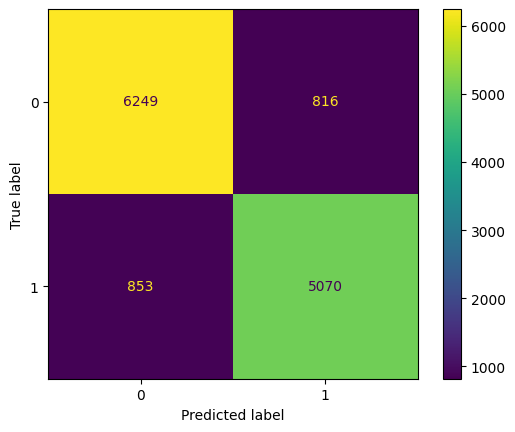

In [32]:
cm = confusion_matrix(gold_preds, preds, labels=[0,1])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0,1])
disp.plot()
plt.show()

## CM Naive Bayes

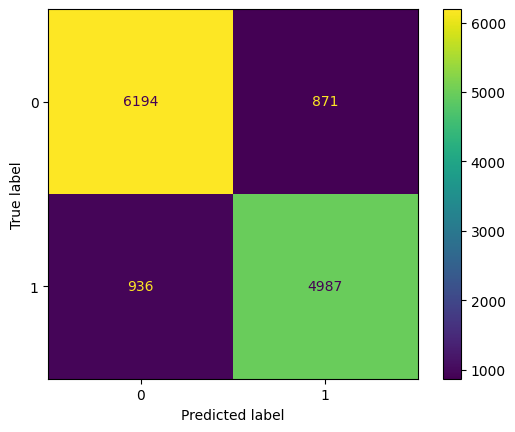

In [17]:
cm = confusion_matrix(nb_gold_preds, nb_preds, labels=[0,1])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0,1])
disp.plot()
plt.show()

## ROC curves

In [24]:
def plot_roc(preds, probs, gold_preds):
    ordered = zip(gold_preds, probs)
    ordered = sorted(ordered, key=lambda x: x[1])
    gold_o = [x[0] for x in ordered]
    probs_o = [x[1] for x in ordered]
    correct = list(zip(gold_preds, preds, probs))
    # changing predicted class probabilities to be reflective of positive class probabilities, for correct AUC calculation
    new_correct = []
    for (x, y, z) in correct:
        if y == 0:
            new_correct.append((x, y, (1-z)))
        else:
            new_correct.append((x, y, z))
    from sklearn.metrics import roc_curve, auc
    import plotly.express as px
    ## y_score holds the probabilities
    y_score = [z for (x, yy, z) in new_correct]
    y = [x for (x, yy, z) in new_correct]
    fpr, tpr, thresholds = roc_curve(y, y_score)
    fig = px.area(
        x=fpr, y=tpr,
        title=f'ROC Curve (AUC={auc(fpr, tpr):.4f})',
        labels=dict(x='False Positive Rate', y='True Positive Rate'),
        width=700, height=500
    )
    fig.add_shape(
        type='line', line=dict(dash='dash'),
        x0=0, x1=1, y0=0, y1=1
    )

    fig.update_yaxes(scaleanchor="x", scaleratio=1)
    fig.update_xaxes(constrain='domain')
    return fig

## ROC curve - Selective Naive Bayes

In [25]:
fig = plot_roc(preds, probs, gold_preds)

## ROC curve - Naive Bayes

In [26]:
plot_roc(nb_preds, nb_probs, gold_preds)

## 10-fold crossvalidation

## Selective Naive Bayes

In [12]:
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
kf = KFold(n_splits=10, shuffle=True, random_state=11)
models = []
tests = []
results = []
accuracies = []
precisions = []
recalls = []
f1_scores = []
for i, (t_ind, v_ind) in enumerate(kf.split(dataset)):
    
    train = dataset.iloc[t_ind]     # train set
    valid = dataset.iloc[v_ind]     # validation set
    
    snb, preds, probs, gold = snb_pipeline(train, test, m=1)
    models.append(snb)
    tests.append(valid)
    results.append((snb, preds, probs, gold))
    accuracies.append(accuracy_score(gold, preds))
    precisions.append(precision_score(gold, preds))
    recalls.append(recall_score(gold, preds))
    f1_scores.append(f1_score(gold, preds)) 
    
print(accuracies)
print(precisions)
print(recalls)
print(f1_scores)

c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:53: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = instance[-1]


Gender
Customer Type
Age
Type of Travel
Class
Flight Distance
Seat comfort
Departure/Arrival time convenient
Food and drink
Gate location
Inflight wifi service
Inflight entertainment
Online support
Ease of Online booking
On-board service
Leg room service
Baggage handling
Checkin service
Cleanliness
Online boarding
Departure Delay in Minutes
Arrival Delay in Minutes


0it [00:00, ?it/s]c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:90: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = example[-1]
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:230: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_gold = example[-1] # true label
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:101: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavio

{(11,): 0.38357095629620247, (11, 6): 0.3584757507634341, (11, 6, 13): 0.33037357565044057, (11, 6, 13, 12): 0.3368668674344976, (11, 6, 13, 12, 1): 0.3300713282819041, (11, 6, 13, 12, 1, 4): 0.31930825808963176, (11, 6, 13, 12, 1, 4, 14): 0.31245961340018824, (11, 6, 13, 12, 1, 4, 14, 19): 0.3270255510880906, (11, 6, 13, 12, 1, 4, 14, 19, 15): 0.32351522175403286, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16): 0.3273920713020812, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18): 0.3351476144956387, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17): 0.33708057484889015, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0): 0.3310681539081569, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8): 0.32947479090150733, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10): 0.33664794771589124, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5): 0.3329762758342551, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5, 2): 0.3316807343887609, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5

c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:53: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = instance[-1]


Gender
Customer Type
Age
Type of Travel
Class
Flight Distance
Seat comfort
Departure/Arrival time convenient
Food and drink
Gate location
Inflight wifi service
Inflight entertainment
Online support
Ease of Online booking
On-board service
Leg room service
Baggage handling
Checkin service
Cleanliness
Online boarding
Departure Delay in Minutes
Arrival Delay in Minutes


0it [00:00, ?it/s]c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:90: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = example[-1]
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:230: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_gold = example[-1] # true label
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:101: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavio

{(11,): 0.3835404799387027, (11, 6): 0.35838112535596417, (11, 6, 13): 0.3300965291548378, (11, 6, 13, 12): 0.3366587229670668, (11, 6, 13, 12, 1): 0.32976894153402553, (11, 6, 13, 12, 1, 4): 0.3190214687902409, (11, 6, 13, 12, 1, 4, 14): 0.31219066405336193, (11, 6, 13, 12, 1, 4, 14, 19): 0.3267463589317759, (11, 6, 13, 12, 1, 4, 14, 19, 15): 0.3232837439410384, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16): 0.3270855165922307, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18): 0.3350523995659888, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17): 0.3369936212563492, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0): 0.3309987169683272, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8): 0.3293666729275189, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10): 0.3365439598235954, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5): 0.33282712002531994, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5, 2): 0.3315226397256194, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5, 2,

c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:53: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = instance[-1]


Gender
Customer Type
Age
Type of Travel
Class
Flight Distance
Seat comfort
Departure/Arrival time convenient
Food and drink
Gate location
Inflight wifi service
Inflight entertainment
Online support
Ease of Online booking
On-board service
Leg room service
Baggage handling
Checkin service
Cleanliness
Online boarding
Departure Delay in Minutes
Arrival Delay in Minutes


0it [00:00, ?it/s]c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:90: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = example[-1]
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:230: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_gold = example[-1] # true label
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:101: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavio

{(11,): 0.3836535391948934, (11, 6): 0.3588356077467388, (11, 6, 13): 0.33083881289325207, (11, 6, 13, 12): 0.3370979807232305, (11, 6, 13, 12, 1): 0.33018473022772726, (11, 6, 13, 12, 1, 4): 0.3194050984405562, (11, 6, 13, 12, 1, 4, 14): 0.31259794057307766, (11, 6, 13, 12, 1, 4, 14, 19): 0.32706325318158147, (11, 6, 13, 12, 1, 4, 14, 19, 15): 0.32354843457731136, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16): 0.32749181704738933, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18): 0.3354289193330375, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17): 0.3374506040338635, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0): 0.3315208774775639, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8): 0.33001045173340304, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10): 0.33715449045664636, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5): 0.3335100813764779, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5, 2): 0.332268830028434, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5,

c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:53: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = instance[-1]


Gender
Customer Type
Age
Type of Travel
Class
Flight Distance
Seat comfort
Departure/Arrival time convenient
Food and drink
Gate location
Inflight wifi service
Inflight entertainment
Online support
Ease of Online booking
On-board service
Leg room service
Baggage handling
Checkin service
Cleanliness
Online boarding
Departure Delay in Minutes
Arrival Delay in Minutes


0it [00:00, ?it/s]c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:90: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = example[-1]
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:230: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_gold = example[-1] # true label
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:101: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavio

{(11,): 0.38380046971280257, (11, 6): 0.3585406065643663, (11, 6, 13): 0.3303203305796616, (11, 6, 13, 12): 0.33719493486294816, (11, 6, 13, 12, 1): 0.33035200703006956, (11, 6, 13, 12, 1, 4): 0.31967351715181513, (11, 6, 13, 12, 1, 4, 14): 0.31274120975820285, (11, 6, 13, 12, 1, 4, 14, 19): 0.32728918472829394, (11, 6, 13, 12, 1, 4, 14, 19, 15): 0.323818901486497, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16): 0.3276584488669541, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18): 0.33553036184626484, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17): 0.3375158746526618, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0): 0.3316490311389984, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8): 0.32996604915279404, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10): 0.3372019755491117, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5): 0.3335768473972535, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5, 2): 0.3322935074851954, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5,

c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:53: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = instance[-1]


Gender
Customer Type
Age
Type of Travel
Class
Flight Distance
Seat comfort
Departure/Arrival time convenient
Food and drink
Gate location
Inflight wifi service
Inflight entertainment
Online support
Ease of Online booking
On-board service
Leg room service
Baggage handling
Checkin service
Cleanliness
Online boarding
Departure Delay in Minutes
Arrival Delay in Minutes


0it [00:00, ?it/s]c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:90: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = example[-1]
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:230: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_gold = example[-1] # true label
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:101: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavio

{(11,): 0.3836579871752903, (11, 6): 0.3584453421339314, (11, 6, 13): 0.3301101664239168, (11, 6, 13, 12): 0.336510319008326, (11, 6, 13, 12, 1): 0.32954021949888707, (11, 6, 13, 12, 1, 4): 0.31863646941626955, (11, 6, 13, 12, 1, 4, 14): 0.31184757343480884, (11, 6, 13, 12, 1, 4, 14, 19): 0.32643374455323926, (11, 6, 13, 12, 1, 4, 14, 19, 15): 0.32298307936530085, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16): 0.326803944241337, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18): 0.3346515466257961, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17): 0.3366471522310214, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0): 0.3306359370301474, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8): 0.3290276028551905, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10): 0.3363030332572097, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5): 0.33261127948871166, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5, 2): 0.3313003448352473, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5, 2,

c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:53: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = instance[-1]


Gender
Customer Type
Age
Type of Travel
Class
Flight Distance
Seat comfort
Departure/Arrival time convenient
Food and drink
Gate location
Inflight wifi service
Inflight entertainment
Online support
Ease of Online booking
On-board service
Leg room service
Baggage handling
Checkin service
Cleanliness
Online boarding
Departure Delay in Minutes
Arrival Delay in Minutes


0it [00:00, ?it/s]c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:90: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = example[-1]
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:230: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_gold = example[-1] # true label
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:101: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavio

{(11,): 0.3839357159511726, (11, 6): 0.3586826349621463, (11, 6, 13): 0.330327112184733, (11, 6, 13, 12): 0.3369035983942131, (11, 6, 13, 12, 1): 0.33003294939204286, (11, 6, 13, 12, 1, 4): 0.3191549141886654, (11, 6, 13, 12, 1, 4, 14): 0.31235116585079326, (11, 6, 13, 12, 1, 4, 14, 19): 0.3269367445639127, (11, 6, 13, 12, 1, 4, 14, 19, 15): 0.3234788416338348, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16): 0.327286938777292, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18): 0.3351545932486287, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17): 0.3372906380645272, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0): 0.33112646718509287, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8): 0.3295714342652042, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10): 0.33663479071688607, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5): 0.3330518436198647, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5, 2): 0.33181096490139234, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5, 2, 

c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:53: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = instance[-1]


Gender
Customer Type
Age
Type of Travel
Class
Flight Distance
Seat comfort
Departure/Arrival time convenient
Food and drink
Gate location
Inflight wifi service
Inflight entertainment
Online support
Ease of Online booking
On-board service
Leg room service
Baggage handling
Checkin service
Cleanliness
Online boarding
Departure Delay in Minutes
Arrival Delay in Minutes


0it [00:00, ?it/s]c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:90: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = example[-1]
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:230: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_gold = example[-1] # true label
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:101: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavio

{(11,): 0.38400909237001296, (11, 6): 0.3586980883330316, (11, 6, 13): 0.3306710375772433, (11, 6, 13, 12): 0.3370087710514884, (11, 6, 13, 12, 1): 0.33015740815767974, (11, 6, 13, 12, 1, 4): 0.31935078295458846, (11, 6, 13, 12, 1, 4, 14): 0.3126727082893764, (11, 6, 13, 12, 1, 4, 14, 19): 0.3271300713716222, (11, 6, 13, 12, 1, 4, 14, 19, 15): 0.3236686312721501, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16): 0.3274784425306055, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18): 0.3353191207533489, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17): 0.3372018160211976, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0): 0.3311948981839762, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8): 0.3295197392088972, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10): 0.3367022125718194, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5): 0.3330578587346426, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5, 2): 0.33184016903529856, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5, 2,

c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:53: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = instance[-1]


Gender
Customer Type
Age
Type of Travel
Class
Flight Distance
Seat comfort
Departure/Arrival time convenient
Food and drink
Gate location
Inflight wifi service
Inflight entertainment
Online support
Ease of Online booking
On-board service
Leg room service
Baggage handling
Checkin service
Cleanliness
Online boarding
Departure Delay in Minutes
Arrival Delay in Minutes


0it [00:00, ?it/s]c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:90: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = example[-1]
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:230: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_gold = example[-1] # true label
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:101: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavio

{(11,): 0.3836296328429024, (11, 6): 0.35811197321756433, (11, 6, 13): 0.330055029480562, (11, 6, 13, 12): 0.3364647843477874, (11, 6, 13, 12, 1): 0.3295112011999517, (11, 6, 13, 12, 1, 4): 0.3187052662603064, (11, 6, 13, 12, 1, 4, 14): 0.3120038030822175, (11, 6, 13, 12, 1, 4, 14, 19): 0.3266714430912697, (11, 6, 13, 12, 1, 4, 14, 19, 15): 0.3230541826706751, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16): 0.3269567058978092, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18): 0.33490983668853574, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17): 0.33700547963208854, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0): 0.33108844451937786, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8): 0.3295362178236589, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10): 0.3367436618371318, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5): 0.33306082783995733, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5, 2): 0.3316874361167058, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5, 2,

c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:53: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = instance[-1]


Gender
Customer Type
Age
Type of Travel
Class
Flight Distance
Seat comfort
Departure/Arrival time convenient
Food and drink
Gate location
Inflight wifi service
Inflight entertainment
Online support
Ease of Online booking
On-board service
Leg room service
Baggage handling
Checkin service
Cleanliness
Online boarding
Departure Delay in Minutes
Arrival Delay in Minutes


0it [00:00, ?it/s]c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:90: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = example[-1]
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:230: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_gold = example[-1] # true label
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:101: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavio

{(11,): 0.3838023483069677, (11, 6): 0.3588025108159896, (11, 6, 13): 0.33048274102506064, (11, 6, 13, 12): 0.33710146355037923, (11, 6, 13, 12, 1): 0.3302029272266078, (11, 6, 13, 12, 1, 4): 0.31939041673408247, (11, 6, 13, 12, 1, 4, 14): 0.31250316285185614, (11, 6, 13, 12, 1, 4, 14, 19): 0.3271146878087227, (11, 6, 13, 12, 1, 4, 14, 19, 15): 0.3235990830399909, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16): 0.3272711227218435, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18): 0.3351507053744904, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17): 0.33713626558073795, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0): 0.33113728180070445, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8): 0.32960206654936375, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10): 0.3368731449340525, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5): 0.3332607663579625, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5, 2): 0.3319482729287958, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5,

c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:53: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = instance[-1]


Gender
Customer Type
Age
Type of Travel
Class
Flight Distance
Seat comfort
Departure/Arrival time convenient
Food and drink
Gate location
Inflight wifi service
Inflight entertainment
Online support
Ease of Online booking
On-board service
Leg room service
Baggage handling
Checkin service
Cleanliness
Online boarding
Departure Delay in Minutes
Arrival Delay in Minutes


0it [00:00, ?it/s]c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:90: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = example[-1]
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:230: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_gold = example[-1] # true label
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:101: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavio

{(11,): 0.3836623398945212, (11, 6): 0.35828215552056725, (11, 6, 13): 0.33020592092670353, (11, 6, 13, 12): 0.3365148146114695, (11, 6, 13, 12, 1): 0.3296960205889213, (11, 6, 13, 12, 1, 4): 0.3190590820111298, (11, 6, 13, 12, 1, 4, 14): 0.3124097828926574, (11, 6, 13, 12, 1, 4, 14, 19): 0.3269499581917059, (11, 6, 13, 12, 1, 4, 14, 19, 15): 0.3232825085184197, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16): 0.32706202602646567, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18): 0.33491194544684355, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17): 0.3370012559067418, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0): 0.33085085511306656, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8): 0.32926582003668503, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10): 0.3364441372039074, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5): 0.33274931972562966, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5, 2): 0.33141773296735133, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5

## 10-fold crossvalidation Naive Bayes

In [31]:
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
kf = KFold(n_splits=10, shuffle=True, random_state=11)
models = []
tests = []
results = []
accuracies = []
precisions = []
recalls = []
f1_scores = []
for i, (t_ind, v_ind) in enumerate(kf.split(dataset)):
    
    train = dataset.iloc[t_ind]     # train set
    valid = dataset.iloc[v_ind]     # validation set
    
    snb, preds, probs, gold = nb_pipeline(train, test, mm=1)
    models.append(snb)
    tests.append(valid)
    results.append((snb, preds, probs, gold))
    accuracies.append(accuracy_score(gold, preds))
    precisions.append(precision_score(gold, preds))
    recalls.append(recall_score(gold, preds))
    f1_scores.append(f1_score(gold, preds)) 
    
print(accuracies)
print(precisions)
print(recalls)
print(f1_scores)

c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:53: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Accuracy Naive Bayes: 0.8609485679088389


c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:53: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Accuracy Naive Bayes: 0.8609485679088389


c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:53: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Accuracy Naive Bayes: 0.8610255620572836


c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:53: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Accuracy Naive Bayes: 0.8602556205728364


c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:53: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Accuracy Naive Bayes: 0.8601786264243918


c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:53: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Accuracy Naive Bayes: 0.8606405913150601


c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:53: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Accuracy Naive Bayes: 0.8605635971666153


c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:53: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Accuracy Naive Bayes: 0.8610255620572836


c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:53: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Accuracy Naive Bayes: 0.8610255620572836


c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:53: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Accuracy Naive Bayes: 0.8608715737603942
[0.8609485679088389, 0.8609485679088389, 0.8610255620572836, 0.8602556205728364, 0.8601786264243918, 0.8606405913150601, 0.8605635971666153, 0.8610255620572836, 0.8610255620572836, 0.8608715737603942]
[0.8512199283398737, 0.8513398190817546, 0.8508861622358554, 0.8507513661202186, 0.8502473136619478, 0.8506393861892583, 0.8509730283373165, 0.8514851485148515, 0.8514851485148515, 0.8513144417890065]
[0.84230964038494, 0.8421408070234678, 0.8429849738308289, 0.8411278068546345, 0.8416343069390512, 0.84230964038494, 0.8416343069390512, 0.8421408070234678, 0.8421408070234678, 0.8419719736619956]
[0.8467413441955194, 0.8467153284671534, 0.8469171401916717, 0.845912216656762, 0.845918886814865, 0.846454021038344, 0.8462779051014344, 0.8467871997283761, 0.8467871997283761, 0.846617434852729]


## Experiment with using zero_one_loss instead of RMSE

In [12]:
snb.select_best_model(zero_one_loss=True)

0it [00:00, ?it/s]c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:89: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = example[-1]
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:178: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y_gold = example[-1] # true label
c:\Users\ultramarine\Desktop\studia_semestr_2\uczenie_maszynowe\projekt\selective_bayes.py:97: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior

Best model attributes (AUC) (11, 6, 13, 12, 1, 4, 14)
Best AUC 0.8732836365872672
{(11,): 0.38379584207006356, (11, 6): 0.3584727561760799, (11, 6, 13): 0.3299840542462907, (11, 6, 13, 12): 0.3365437301902333, (11, 6, 13, 12, 1): 0.3296213788943885, (11, 6, 13, 12, 1, 4): 0.31876557036527814, (11, 6, 13, 12, 1, 4, 14): 0.31190276974200354, (11, 6, 13, 12, 1, 4, 14, 19): 0.3265074519544284, (11, 6, 13, 12, 1, 4, 14, 19, 15): 0.32298517206859045, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16): 0.32677742674586596, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18): 0.33472412139332014, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17): 0.3366590383578592, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0): 0.33065058426286464, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8): 0.32898278320247515, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10): 0.3361324898547366, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5): 0.3324405965386776, (11, 6, 13, 12, 1, 4, 14, 19, 15, 16, 18, 17, 0, 8, 10, 5,